
- Perform data preparations to clean data
- Exploratory Data Analysis (explore the distributions and characteristics of the columns and compare variables to view their behavior and relationships)
- Cluster the data using K-Means, Hierarchical Clustering
- Create a prediction model using any classification algorithm and compare the results


In [6]:
import pandas as pd
url = "data.csv"
df = pd.read_csv(url, delimiter=';')
df.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


# Data Preparation (cleaning)

In [7]:
df.isnull().sum()

Marital status                                    0
Application mode                                  0
Application order                                 0
Course                                            0
Daytime/evening attendance\t                      0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            0
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   0
Displaced                                         0
Educational special needs                         0
Debtor                                            0
Tuition fees up to date                           0
Gender                                            0
Scholarship holder                                0
Age at enrol

In [8]:
df.duplicated().sum()

0

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance	                     4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Previous qualification (grade)                  4424 non-null   float64
 7   Nacionality                                     4424 non-null   int64  
 8   Mother's qualification                          4424 non-null   int64  
 9   Father's qualification                   

In [9]:
df.rename(columns = {'Nacionality':'Nationality', 'Age at enrollment':'Age'}, inplace = True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance	                     4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Previous qualification (grade)                  4424 non-null   float64
 7   Nationality                                     4424 non-null   int64  
 8   Mother's qualification                          4424 non-null   int64  
 9   Father's qualification                   

In [10]:
df.dtypes

Marital status                                      int64
Application mode                                    int64
Application order                                   int64
Course                                              int64
Daytime/evening attendance\t                        int64
Previous qualification                              int64
Previous qualification (grade)                    float64
Nationality                                         int64
Mother's qualification                              int64
Father's qualification                              int64
Mother's occupation                                 int64
Father's occupation                                 int64
Admission grade                                   float64
Displaced                                           int64
Educational special needs                           int64
Debtor                                              int64
Tuition fees up to date                             int64
Gender        

Encoding 'Target' will be done later on, since I think providing labeled data in visualization (EDA) is better.

Scaling will also be done later on.

# EDA

In [11]:
df.describe()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nationality,Mother's qualification,Father's qualification,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,...,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,1.178571,18.669078,1.727848,8856.642631,0.890823,4.577758,132.613314,1.873192,19.561935,22.275316,...,0.137658,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969
std,0.605747,17.484682,1.313793,2063.566416,0.311897,10.216592,13.188332,6.914514,15.603186,15.343108,...,0.690880,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,...,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,...,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,...,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,6.000000,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,...,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


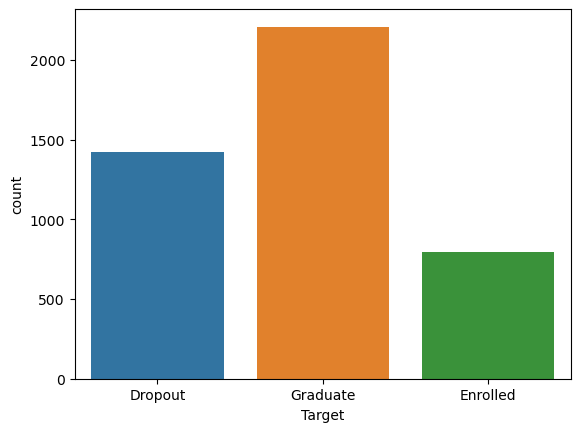

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='Target', data=df)
plt.show()

<Axes: ylabel='Target'>

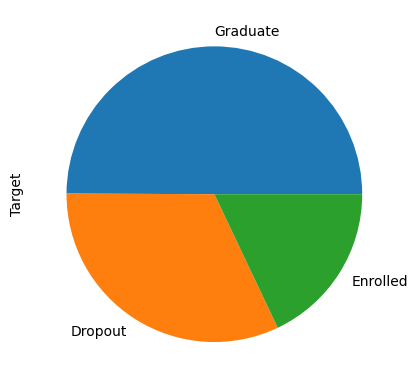

In [19]:
# Pie chart
df['Target'].value_counts().plot.pie()

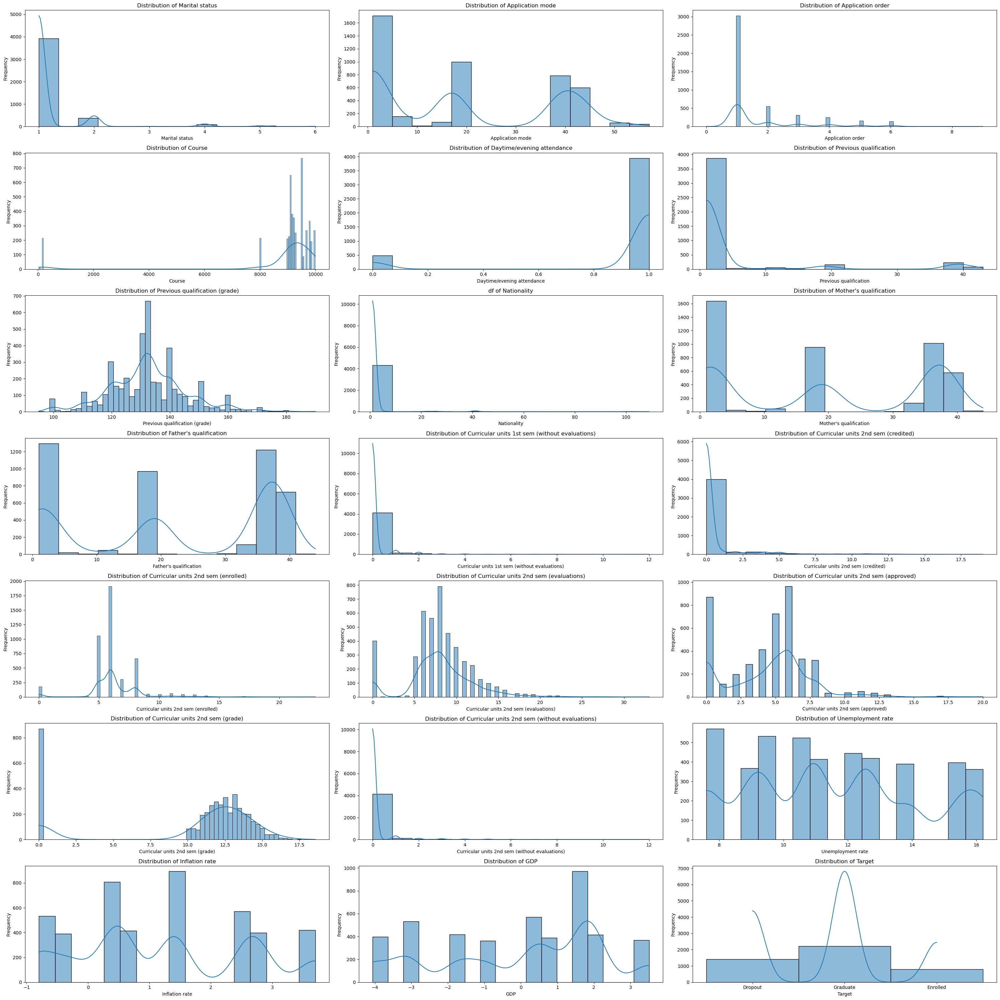

In [20]:
fig, axes = plt.subplots(7, 3, figsize=(30, 30))
axes = axes.flatten()

sns.histplot(data=df, x="Marital status", kde=True, ax=axes[0])
axes[0].set_title("Distribution of Marital status")
axes[0].set_xlabel("Marital status")
axes[0].set_ylabel("Frequency")

sns.histplot(data=df, x="Application mode", kde=True, ax=axes[1])
axes[1].set_title("Distribution of Application mode")
axes[1].set_xlabel("Application mode")
axes[1].set_ylabel("Frequency")

sns.histplot(data=df, x="Application order", kde=True, ax=axes[2])
axes[2].set_title("Distribution of Application order")
axes[2].set_xlabel("Application order")
axes[2].set_ylabel("Frequency")

sns.histplot(data=df, x="Course", kde=True, ax=axes[3])
axes[3].set_title("Distribution of Course")
axes[3].set_xlabel("Course")
axes[3].set_ylabel("Frequency")

sns.histplot(data=df, x="Daytime/evening attendance\t", kde=True, ax=axes[4])
axes[4].set_title("Distribution of Daytime/evening attendance")
axes[4].set_xlabel("Daytime/evening attendance")
axes[4].set_ylabel("Frequency")

sns.histplot(data=df, x="Previous qualification", kde=True, ax=axes[5])
axes[5].set_title("Distribution of Previous qualification")
axes[5].set_xlabel("Previous qualification")
axes[5].set_ylabel("Frequency")

sns.histplot(data=df, x="Previous qualification (grade)", kde=True, ax=axes[6])
axes[6].set_title("Distribution of Previous qualification (grade)")
axes[6].set_xlabel("Previous qualification (grade)")
axes[6].set_ylabel("Frequency")

sns.histplot(data=df, x="Nationality", kde=True, ax=axes[7])
axes[7].set_title("df of Nationality")
axes[7].set_xlabel("Nationality")
axes[7].set_ylabel("Frequency")

sns.histplot(data=df, x="Mother's qualification", kde=True, ax=axes[8])
axes[8].set_title("Distribution of Mother's qualification")
axes[8].set_xlabel("Mother's qualification")
axes[8].set_ylabel("Frequency")

sns.histplot(data=df, x="Father's qualification", kde=True, ax=axes[9])
axes[9].set_title("Distribution of Father's qualification")
axes[9].set_xlabel("Father's qualification")
axes[9].set_ylabel("Frequency")

sns.histplot(data=df, x="Curricular units 1st sem (without evaluations)", kde=True, ax=axes[10])
axes[10].set_title("Distribution of Curricular units 1st sem (without evaluations)")
axes[10].set_xlabel("Curricular units 1st sem (without evaluations)")
axes[10].set_ylabel("Frequency")

sns.histplot(data=df, x="Curricular units 2nd sem (credited)", kde=True, ax=axes[11])
axes[11].set_title("Distribution of Curricular units 2nd sem (credited)")
axes[11].set_xlabel("Curricular units 2nd sem (credited)")
axes[11].set_ylabel("Frequency")

sns.histplot(data=df, x="Curricular units 2nd sem (enrolled)", kde=True, ax=axes[12])
axes[12].set_title("Distribution of Curricular units 2nd sem (enrolled)")
axes[12].set_xlabel("Curricular units 2nd sem (enrolled)")
axes[12].set_ylabel("Frequency")

sns.histplot(data=df, x="Curricular units 2nd sem (evaluations)", kde=True, ax=axes[13])
axes[13].set_title("Distribution of Curricular units 2nd sem (evaluations)")
axes[13].set_xlabel("Curricular units 2nd sem (evaluations)")
axes[13].set_ylabel("Frequency")

sns.histplot(data=df, x="Curricular units 2nd sem (approved)", kde=True, ax=axes[14])
axes[14].set_title("Distribution of Curricular units 2nd sem (approved)")
axes[14].set_xlabel("Curricular units 2nd sem (approved)")
axes[14].set_ylabel("Frequency")

sns.histplot(data=df, x="Curricular units 2nd sem (grade)", kde=True, ax=axes[15])
axes[15].set_title("Distribution of Curricular units 2nd sem (grade)")
axes[15].set_xlabel("Curricular units 2nd sem (grade)")
axes[15].set_ylabel("Frequency")

sns.histplot(data=df, x="Curricular units 2nd sem (without evaluations)", kde=True, ax=axes[16])
axes[16].set_title("Distribution of Curricular units 2nd sem (without evaluations)")
axes[16].set_xlabel("Curricular units 2nd sem (without evaluations)")
axes[16].set_ylabel("Frequency")

sns.histplot(data=df, x="Unemployment rate", kde=True, ax=axes[17])
axes[17].set_title("Distribution of Unemployment rate")
axes[17].set_xlabel("Unemployment rate")
axes[17].set_ylabel("Frequency")

sns.histplot(data=df, x="Inflation rate", kde=True, ax=axes[18])
axes[18].set_title("Distribution of Inflation rate")
axes[18].set_xlabel("Inflation rate")
axes[18].set_ylabel("Frequency")

sns.histplot(data=df, x="GDP", kde=True, ax=axes[19])
axes[19].set_title("Distribution of GDP")
axes[19].set_xlabel("GDP")
axes[19].set_ylabel("Frequency")

sns.histplot(data=df, x="Target", kde=True, ax=axes[20])
axes[20].set_title("Distribution of Target")
axes[20].set_xlabel("Target")
axes[20].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [21]:
df.corr()

/var/folders/9q/xjqpb26518s1vvw5v5d2nx8c0000gq/T/ipykernel_73378/1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nationality,Mother's qualification,Father's qualification,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
Marital status,1.000000,0.264006,-0.125854,0.046365,-0.274939,0.062529,-0.022406,-0.008843,0.193163,0.130353,...,0.034711,0.062831,0.039026,0.022784,-0.043739,-0.071506,0.020426,-0.020338,0.008761,-0.027003
Application mode,0.264006,1.000000,-0.286357,0.065385,-0.304092,0.422411,-0.039020,-0.000661,0.118974,0.083276,...,0.045828,0.238445,0.130046,0.167872,-0.071526,-0.115424,0.047983,0.089080,-0.016375,-0.022743
Application order,-0.125854,-0.286357,1.000000,0.059507,0.158657,-0.184315,-0.064484,-0.022416,-0.064956,-0.050288,...,-0.031699,-0.125815,0.028878,-0.055089,0.071793,0.055517,-0.015757,-0.098419,-0.011133,0.030201
Course,0.046365,0.065385,0.059507,1.000000,-0.043151,0.006654,-0.081013,-0.033923,0.054543,0.050724,...,0.034514,-0.089817,0.401539,0.278797,0.198032,0.348728,0.030816,0.007153,0.017710,-0.020265
Daytime/evening attendance\t,-0.274939,-0.304092,0.158657,-0.043151,1.000000,-0.071871,0.052597,0.018530,-0.204767,-0.139894,...,0.045630,-0.111953,0.000371,0.014610,0.034022,0.050493,-0.004229,0.061974,-0.024043,0.022929
Previous qualification,0.062529,0.422411,-0.184315,0.006654,-0.071871,1.000000,0.104072,-0.029214,-0.013190,-0.006614,...,0.002887,0.143031,0.056179,0.114850,-0.008632,0.000942,0.005102,0.111958,-0.063736,0.064069
Previous qualification (grade),-0.022406,-0.039020,-0.064484,-0.081013,0.052597,0.104072,1.000000,0.054088,-0.060670,-0.035234,...,-0.003926,-0.018489,-0.031649,-0.061355,0.050263,0.053239,-0.019015,0.045222,0.018710,-0.052620
Nationality,-0.008843,-0.000661,-0.022416,-0.033923,0.018530,-0.029214,0.054088,1.000000,-0.049946,-0.085282,...,0.009145,-0.007278,-0.020113,-0.025721,-0.017880,-0.008497,-0.014041,-0.000651,-0.008922,0.034478
Mother's qualification,0.193163,0.118974,-0.064956,0.054543,-0.204767,-0.013190,-0.060670,-0.049946,1.000000,0.535140,...,0.003183,0.042771,0.035150,0.021033,-0.014858,-0.031175,0.021305,-0.114351,0.059441,-0.083657
Father's qualification,0.130353,0.083276,-0.050288,0.050724,-0.139894,-0.006614,-0.035234,-0.085282,0.535140,1.000000,...,-0.017333,0.042666,0.024380,0.009514,0.005285,-0.008083,-0.007430,-0.077905,0.057633,-0.071610


/var/folders/9q/xjqpb26518s1vvw5v5d2nx8c0000gq/T/ipykernel_73378/1475567347.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
/Users/mac/anaconda3/lib/python3.11/site-packages/seaborn/utils.py:80: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.draw()
/Users/mac/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


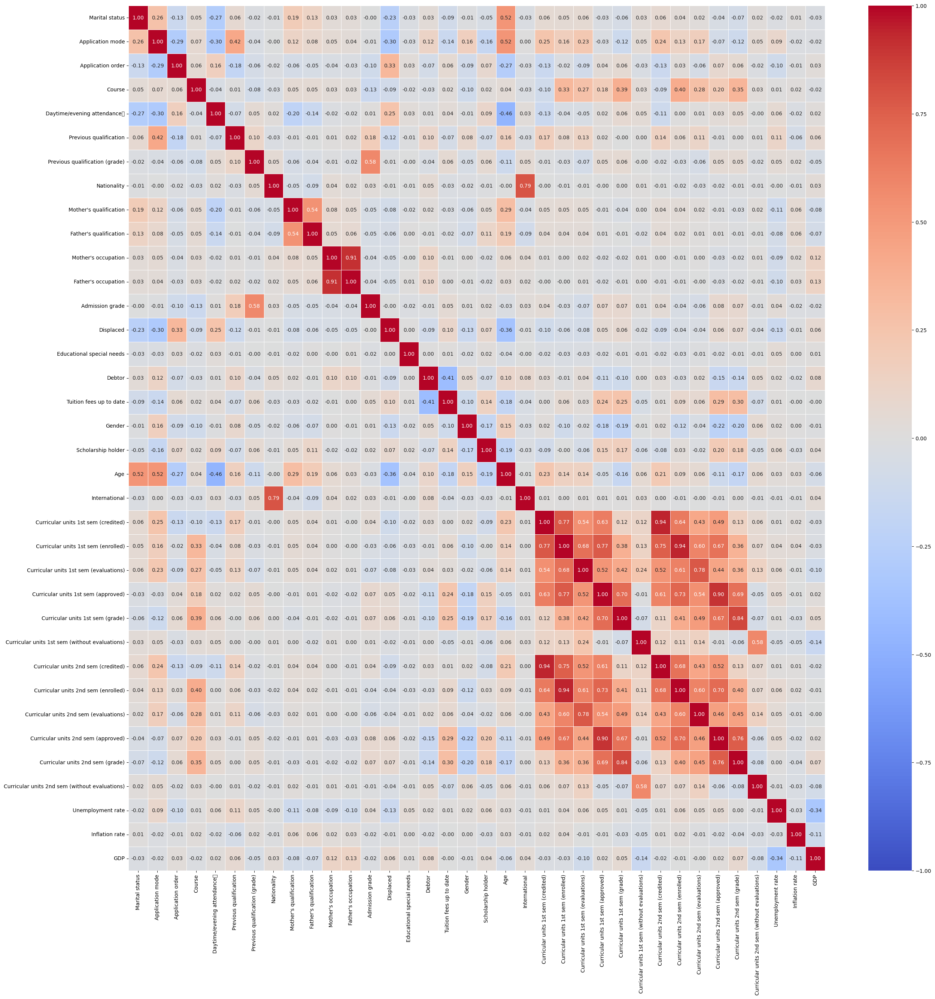

In [22]:
plt.figure(figsize=(30, 30))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.show()

In [34]:
sns.pairplot(df)

/Users/mac/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: Glyph 9 (	) missing from current font.
  self._figure.tight_layout(*args, **kwargs)


/Users/mac/anaconda3/lib/python3.11/site-packages/IPython/core/events.py:89: UserWarning: Glyph 9 (	) missing from current font.
  func(*args, **kwargs)
/Users/mac/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


/var/folders/9q/xjqpb26518s1vvw5v5d2nx8c0000gq/T/ipykernel_73378/3967741008.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['Target'] == 'Dropout']['Scholarship holder'], color='green', kde=True)
/var/folders/9q/xjqpb26518s1vvw5v5d2nx8c0000gq/T/ipykernel_73378/3967741008.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed29

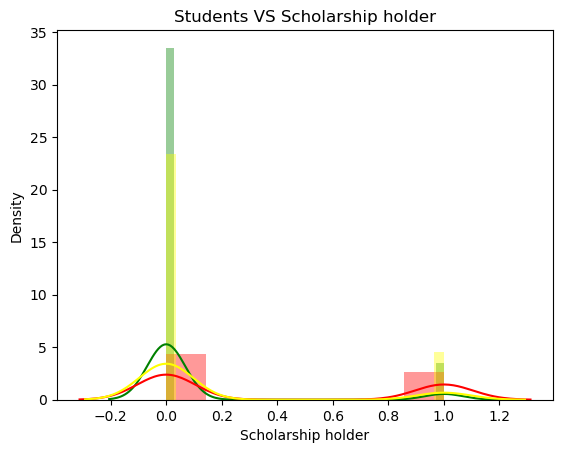

In [23]:
sns.distplot(df[df['Target'] == 'Dropout']['Scholarship holder'], color='green', kde=True)
sns.distplot(df[df['Target'] == 'Graduate']['Scholarship holder'], color='red', kde=True)
sns.distplot(df[df['Target'] == 'Enrolled']['Scholarship holder'], color='yellow', kde=True)
plt.title("Students VS Scholarship holder")
plt.show()

<Axes: xlabel='Debtor', ylabel='count'>

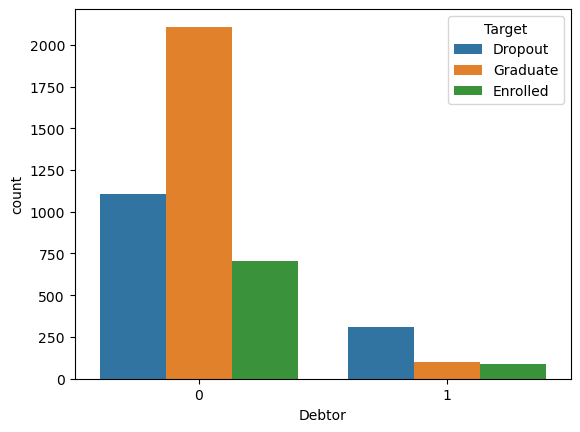

In [24]:
sns.countplot(x='Debtor',data=df,hue='Target')

<Axes: xlabel='Course', ylabel='count'>

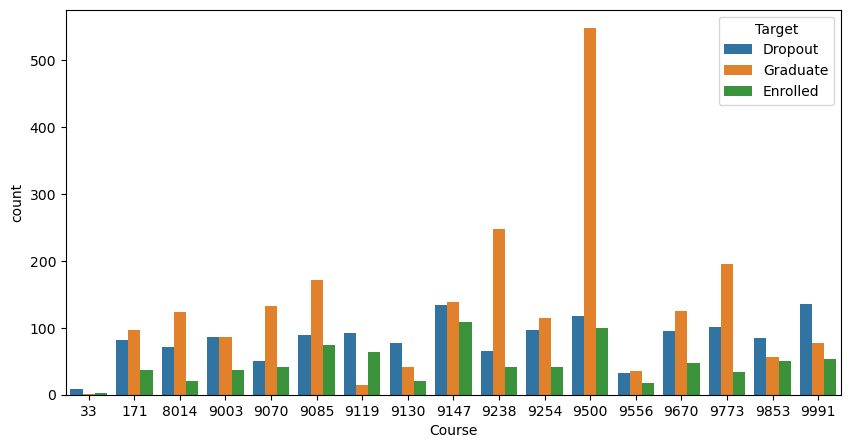

In [25]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.countplot(x=df['Course'], data=df, hue='Target', ax=ax)

# Data Preprocessing (Encoding & Scaling)

In [26]:
from sklearn.preprocessing import LabelEncoder

target_column = df['Target']

label_encoder = LabelEncoder()
encoded_target = label_encoder.fit_transform(target_column)

df['Target'] = encoded_target
df.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nationality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,0
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,2
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,0
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,2
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,2


In [27]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_data, columns=df.columns)
scaled_df.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nationality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,-0.294829,-0.095470,2.490896,-4.209520,0.350082,-0.35023,-0.804841,-0.126298,-0.036018,-0.669778,...,-0.282442,-2.838337,-2.042630,-1.471527,-1.963489,-0.199441,-0.287638,0.124386,0.765761,-1.326497
1,-0.294829,-0.209869,-0.554068,0.192580,0.350082,-0.35023,2.076819,-0.126298,-1.189759,-1.256427,...,-0.282442,-0.105726,-0.522682,0.518904,0.659562,-0.199441,0.876222,-1.105222,0.347199,0.925392
2,-0.294829,-1.010660,2.490896,0.103404,0.350082,-0.35023,-0.804841,-0.126298,1.117723,0.959802,...,-0.282442,-0.105726,-2.042630,-1.471527,-1.963489,-0.199441,-0.287638,0.124386,0.765761,-1.326497
3,-0.294829,-0.095470,0.207173,0.444115,0.350082,-0.35023,-0.804841,-0.126298,1.181819,0.959802,...,-0.282442,-0.105726,0.490616,0.187165,0.416450,-0.199441,-0.813253,-1.466871,-1.375511,0.925392
4,1.356212,1.162916,-0.554068,-0.408389,-2.856470,-0.35023,-2.473171,-0.126298,1.117723,1.024985,...,-0.282442,-0.105726,-0.522682,0.518904,0.531608,-0.199441,0.876222,-1.105222,0.347199,0.925392


# Clustering

K-means clustering

/Users/mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'au

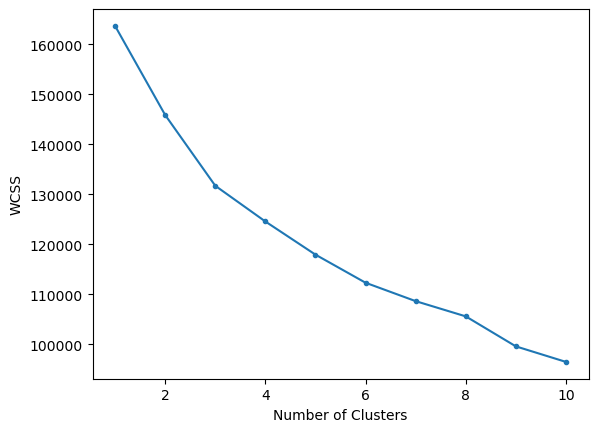

In [28]:
from sklearn.cluster import KMeans
# Elbow
ssquares = []
for i in range(1,11) :
  km = KMeans(n_clusters=i, max_iter=500, random_state=32)
  km.fit(scaled_df)
  ssquares.append(km.inertia_)
plt.plot(range(1,11), ssquares, marker = '.')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [29]:
# using kneelocator to find the elbow
from kneed import KneeLocator

findknee = KneeLocator(range(1,11), ssquares, curve="convex", direction="decreasing")
print("the best k for your model is ",findknee.elbow)


the best k for your model is  3


In [30]:

kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(scaled_df)

cluster_labels = kmeans.labels_
df['Target'] = cluster_labels
df.head()

/Users/mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nationality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,0
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,1
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,0
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,1
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,1


In [31]:
numeric_cols = scaled_df.select_dtypes(include=[int, float]).columns
categorical_cols = scaled_df.select_dtypes(include=[object]).columns

cluster_summary = df.groupby("Target").agg({
    **{col: "mean" for col in numeric_cols},
    **{col: lambda x: x.mode().iloc[0] for col in categorical_cols}, 
    "Target": "count"
})

cluster_summary.columns = df.columns
print(cluster_summary)

        Marital status  Application mode  Application order       Course  \
Target                                                                     
0             1.266593         23.103982           1.556416  7435.560841   
1             1.143254         16.180920           1.827416  9328.747453   
2             1.302491         33.081851           1.131673  7986.572954   

        Daytime/evening attendance\t  Previous qualification  \
Target                                                         
0                           0.855088                4.788717   
1                           0.915715                4.081198   
2                           0.718861                9.622776   

        Previous qualification (grade)  Nationality  Mother's qualification  \
Target                                                                        
0                           132.398119     1.819690               20.502212   
1                           132.729670     1.896573          

0 = dropout ; 1= Graduate ; 2: Enrolled

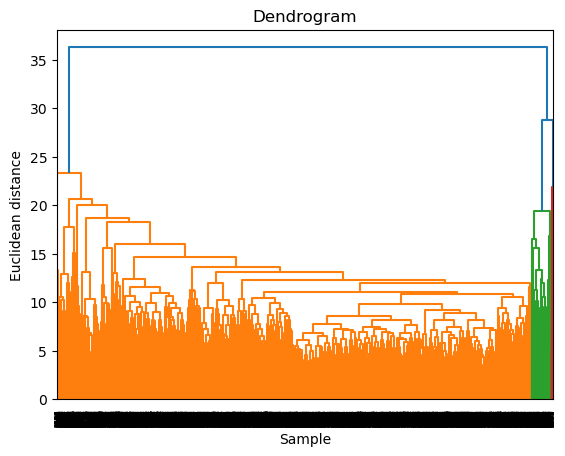

In [32]:
import scipy.cluster.hierarchy as sch

dendrogram = sch.dendrogram(sch.linkage(scaled_df, method='complete'))

plt.title('Dendrogram')
plt.xlabel('Sample')
plt.ylabel('Euclidean distance')
plt.show()

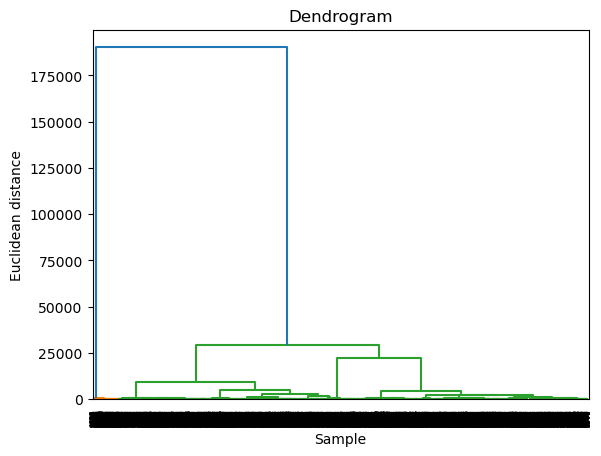

In [33]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

linkage_matrix = linkage(df, method='ward', metric='euclidean')

hierarchical_clusters = fcluster(linkage_matrix, t=3, criterion='maxclust')

dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample')
plt.ylabel('Euclidean distance')
plt.show()

In [34]:
from sklearn.cluster import AgglomerativeClustering

clustering = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
cluster_labels = clustering.fit_predict(scaled_data)

df['Cluster'] = cluster_labels

numeric_cols = df.select_dtypes(include=[int, float]).columns
categorical_cols = df.select_dtypes(include=[object]).columns

cluster_stats = df.groupby("Cluster").agg({
    **{col: "mean" for col in numeric_cols},
    **{col: lambda x: x.mode().iloc[0] for col in categorical_cols}, 
    "Cluster": "count"
})

cluster_stats.columns = df.columns
cluster_stats.head()

/Users/mac/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nationality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target,Cluster
Cluster,,,,,,,,,,,,,,,,,,,,,
0,1.175516,16.724779,1.816224,9303.646903,0.904425,4.279056,132.713422,2.093805,19.296165,22.183481,...,6.198230,8.445133,4.930383,12.108677,0.116519,11.518909,1.196136,0.089484,0.947493,3390
1,1.296167,33.247387,1.132404,8001.041812,0.752613,7.864111,131.311498,1.456446,22.135889,24.888502,...,11.139373,14.118467,9.501742,12.615743,0.167247,11.493380,1.466551,-0.215157,1.860627,287
2,1.147256,21.891566,1.555556,7156.793842,0.882195,4.670683,132.659170,1.032129,19.779116,21.688086,...,4.500669,4.004016,0.244980,0.788884,0.297189,11.808434,1.281124,-0.311767,0.073628,747


0 = dropout ; 1= Graduate ; 2: Enrolled

# Classification

In [25]:
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.pipeline import make_pipeline

In [26]:
df_class = scaled_df.copy()

In [27]:
names = [
    "Nearest Neighbors",
    "Decision Tree",
    "Random Forest",
    "AdaBoost",
    "Naive Bayes Gaussian",
    "Logistic regression"
]

In [28]:
classifiers = [
    KNeighborsClassifier(5),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=15, max_features=15, random_state=0),
    AdaBoostClassifier(),
    GaussianNB(),
    LogisticRegression(random_state=0)
]

In [29]:
X = df_class.drop('Target', axis=1)
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


In [30]:
def classifier_score(names, classifiers):
    results = {"name":[],
              "score": []}
    i = 1
    for name, clf in zip(names, classifiers):
        clf = make_pipeline(StandardScaler(), clf)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)
        print(f"classifier {name}: has score {score}")
        results["name"].append(name)
        results["score"].append(score)
  
    return results

In [31]:
data = classifier_score(names, classifiers)

classifier Nearest Neighbors: has score 0.9672316384180791
classifier Decision Tree: has score 0.9819209039548022
classifier Random Forest: has score 0.9853107344632769
classifier AdaBoost: has score 0.9751412429378531
classifier Naive Bayes Gaussian: has score 0.9378531073446328
classifier Logistic regression: has score 0.9898305084745763


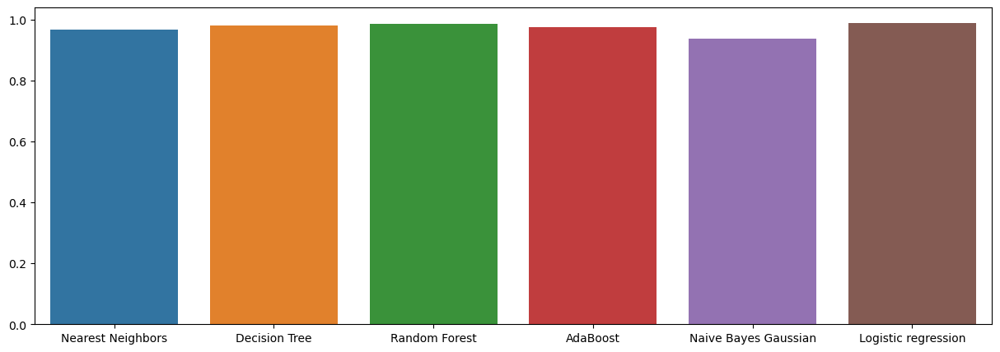

In [32]:
fig ,ax = plt.subplots(figsize=(15,5)) 
sns.barplot(x="name", y="score", data=data, ax=ax );